In [1]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

In [50]:
# MTG benchmark

adata_mtg = sc.read_h5ad('mtg_baselines2.h5ad')
adata_mtg

import os
from pathlib import Path
directory = Path('Benchmarking_results/MTG')
for filename in directory.rglob('*.npy'):
    name = str(filename)[25:-4]
    adata_mtg.obsm[name] = np.load(filename)
    
for i in range(10):
    adata_mtg.obsm['GraphST'+str(i)] = sc.pp.pca(adata_mtg.obsm['GraphST'+str(i)])

from simvi.model import SimVI
edge_index = SimVI.extract_edge_index(adata_mtg,n_neighbors=10,batch_key='batch')
import numpy as np
from scipy.sparse import coo_matrix, csr_matrix
coo = coo_matrix((np.ones(edge_index[0].shape[0]), (edge_index[0].numpy(), edge_index[1].numpy())), shape=(adata_mtg.shape[0],adata_mtg.shape[0]))
for i in range(10):
    adata_mtg.obsm['scviavg'+str(i)] = 0.1 * coo.toarray() @ adata_mtg.obsm['scvi_'+str(i)]
    adata_mtg.obsm['cellcharter'+str(i)] = np.hstack((adata_mtg.obsm['scvi_'+str(i)],adata_mtg.obsm['scviavg'+str(i)]))
    
s_list = ['cellcharter'+str(i) for i in range(10)]
s_list.extend(['STAGATE'+str(i) for i in range(10)])
s_list.extend(['STAGATE_harmony'+str(i) for i in range(10)])
s_list.extend(['GraphST'+str(i) for i in range(10)])
s_list.extend(['GraphST_harmony'+str(i) for i in range(10)])
s_list.extend(['spicemix'+str(i) for i in range(10)])
s_list.extend(['harmony'+str(i) for i in range(10)])
s_list.extend(['nsf_s'+str(i) for i in range(10)])
s_list.extend(['mefisto_z'+str(i) for i in range(10)])

Global seed set to 0


In [3]:
sc.pp.normalize_total(adata_mtg)
sc.pp.log1p(adata_mtg)
sc.pp.pca(adata_mtg)

In [4]:
meta_data = adata_mtg.obs
vars_use=['batch']

import harmonypy as hm
for i in range(10):
    data_mat=adata_mtg.obsm['spicemix'+str(i)]
    ho = hm.run_harmony(data_mat, meta_data,vars_use,random_state=i)
    adata_mtg.obsm['spicemix_harmony'+str(i)] = ho.Z_corr.T
    np.save('Benchmarking_results/MTG/'+'spicemix_harmony'+str(i)+'.npy',adata_mtg.obsm['spicemix_harmony'+str(i)])

2024-03-24 17:52:12,325 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-24 17:52:15,822 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-24 17:52:16,135 - harmonypy - INFO - Iteration 1 of 10
2024-03-24 17:52:19,198 - harmonypy - INFO - Iteration 2 of 10
2024-03-24 17:52:21,818 - harmonypy - INFO - Iteration 3 of 10
2024-03-24 17:52:24,090 - harmonypy - INFO - Iteration 4 of 10
2024-03-24 17:52:25,485 - harmonypy - INFO - Iteration 5 of 10
2024-03-24 17:52:26,261 - harmonypy - INFO - Iteration 6 of 10
2024-03-24 17:52:27,070 - harmonypy - INFO - Iteration 7 of 10
2024-03-24 17:52:28,090 - harmonypy - INFO - Iteration 8 of 10
2024-03-24 17:52:28,960 - harmonypy - INFO - Converged after 8 iterations
2024-03-24 17:52:28,978 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-24 17:52:32,040 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-24 17:52:32,371 - harmonypy - INFO - Iteration 1 of 

In [6]:
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection
biocons = BioConservation(isolated_labels=False,nmi_ari_cluster_labels_leiden=True,nmi_ari_cluster_labels_kmeans=False,clisi_knn=False)
bat = BatchCorrection(ilisi_knn=False)

adata_mtg_ = adata_mtg[~adata_mtg.obs['cluster_L1'].isin(['oENDO','oMURAL'])].copy()

bm2 = Benchmarker(
    adata_mtg_,
    batch_key="batch",
    label_key="niche",
    embedding_obsm_keys=s_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm2.benchmark()

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:  10%|██████████████████▉                                                                                                                                                                          | 1/10 [00:02<00:22,  2.46s/it, Bio conservation: silhouette_label]No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:10<00:17,  3.41s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:10<00:17,  3.51s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:22,  4.47s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:15<00:23,  4.61s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:15<00:22,  4.52s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:21,  4.29s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:17<00:26,  5.30s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:11<00:16,  3.28s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:13<00:18,  3.76s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:12<00:17,  3.59s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:14<00:26,  5.26s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:13<00:23,  4.76s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

In [7]:
bm2._results.to_csv('Benchmarking_results/mtg_niche_add.csv')

In [8]:
z_list = ['cellcharter'+str(i) for i in range(10)]
z_list.extend(['STAGATE'+str(i) for i in range(10)])
z_list.extend(['STAGATE_harmony'+str(i) for i in range(10)])
z_list.extend(['GraphST'+str(i) for i in range(10)])
z_list.extend(['GraphST_harmony'+str(i) for i in range(10)])
z_list.extend(['spicemix'+str(i) for i in range(10)])
z_list.extend(['harmony'+str(i) for i in range(10)])
z_list.extend(['nsf_s'+str(i) for i in range(10)])
z_list.extend(['mefisto_z'+str(i) for i in range(10)])

bm = Benchmarker(
    adata_mtg,
    batch_key="batch",
    label_key="cluster_L1",
    embedding_obsm_keys=z_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm.benchmark()
bm._results.to_csv('Benchmarking_results/mtg_ct_add.csv')

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:23<00:43,  8.62s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:20<00:37,  7.51s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:22<00:34,  6.85s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:18<00:26,  5.39s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:20<00:30,  6.09s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:15<00:25,  5.10s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                      

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:12<00:20,  4.02s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:13<00:23,  4.65s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:09<00:14,  2.99s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:10<00:18,  3.71s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                       

Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:06<00:10,  2.17s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 90/90 [26:19<00:00, 17.55s/it]

                                                                                                                                                                                                                                                      

In [9]:
adata_mtg.obs['Myh11'] = 'Non-expressed'
adata_mtg.obs['Myh11'][adata_mtg[:,'MYH11'].X.flatten()>=1] = 'Expressed'

bm3 = Benchmarker(
    adata_mtg,
    batch_key="cluster_L1",
    label_key="Myh11",
    embedding_obsm_keys=s_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm3.benchmark()

bm3._results.to_csv('Benchmarking_results/mtg_myh11_add.csv')

/tmp/ipykernel_1008034/3250447451.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_mtg.obs['Myh11'][adata_mtg[:,'MYH11'].X.flatten()>=1] = 'Expressed'
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avo

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                             

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:10<00:26,  3.85s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:11<00:28,  4.11s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:11<00:27,  3.93s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:10<00:25,  3.57s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:13<00:32,  4.68s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:09<00:24,  3.43s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:10<00:25,  3.71s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:10<00:25,  3.70s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  30%|█████████████████████████████████████████████████████████▎                                                                                                                                     | 3/10 [00:10<00:25,  3.63s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                          

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                             

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:11<00:19,  3.87s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting

                                                                                                                                                                                                                                                                              
Metrics:  50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 5/10 [00:11<00:19,  3.82s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                                         

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 90/90 [20:30<00:00, 13.67s/it]

                                                                                                                                                                                                                                                                              

In [ ]:
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection
biocons = BioConservation(isolated_labels=False,nmi_ari_cluster_labels_leiden=True,nmi_ari_cluster_labels_kmeans=False,clisi_knn=False)
bat = BatchCorrection(ilisi_knn=False)

adata_mtg_ = adata_mtg[~adata_mtg.obs['cluster_L1'].isin(['oENDO','oMURAL'])].copy()

spicemix_list = ['spicemix'+str(i) for i in range(10)]
spicemix_list.extend(['spicemix_harmony'+str(i) for i in range(10)])

bm2 = Benchmarker(
    adata_mtg_,
    batch_key="batch",
    label_key="niche",
    embedding_obsm_keys=spicemix_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm2.benchmark()
bm2._results.to_csv('Benchmarking_results/mtg_niche_spicemix.csv')

bm = Benchmarker(
    adata_mtg,
    batch_key="batch",
    label_key="cluster_L1",
    embedding_obsm_keys=spicemix_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm.benchmark()
bm._results.to_csv('Benchmarking_results/mtg_ct_spicemix.csv')

adata_mtg.obs['Myh11'] = 'Non-expressed'
adata_mtg.obs['Myh11'][adata_mtg[:,'MYH11'].X.flatten()>=1] = 'Expressed'

bm3 = Benchmarker(
    adata_mtg,
    batch_key="cluster_L1",
    label_key="Myh11",
    embedding_obsm_keys=spicemix_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm3.benchmark()

bm3._results.to_csv('Benchmarking_results/mtg_myh11_spicemix.csv')

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:  10%|█████████████████▍                                                                                                                                                            | 1/10 [00:02<00:20,  2.32s/it, Bio conservation: silhouette_label]No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:22<00:38,  7.72s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                         

                                                                                                                                                                                                                                                               
Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:17<00:25,  5.06s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                    

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:17<00:30,  6.07s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:  50%|███████

                                                                                                                                                                                                                                                               
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:   0%|                                                                                                                                                                                                                          

                                                                                                                                                                                                                                                               
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Embeddings: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:22<00:36,  7.28s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:  50%|██████

Metrics:  50%|████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 5/10 [00:17<00:31,  6.22s/it, Batch correction: pcr_comparison]/usr/local/lib/python3.8/dist-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(
Metrics:   0%|                                                                                                                                                                                                                          | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                               
Metrics:   0%|       

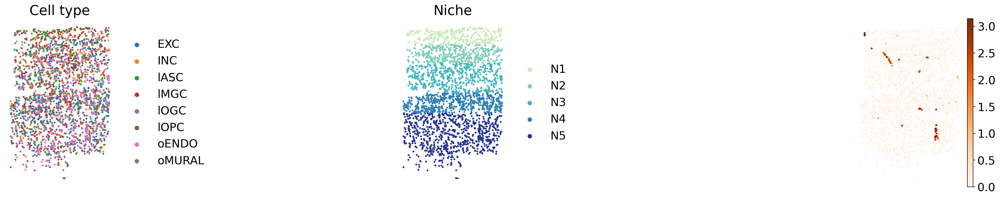

In [23]:
#sc.pp.normalize_total(adata_mtg)
#sc.pp.log1p(adata_mtg)
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18
adata_mtg.uns['niche_colors'] = ['#c7e9b4','#7fcdbb','#41b6c4','#2c7fb8','#253494','#081d58']
sc.pl.spatial(adata_mtg[adata_mtg.obs['batch']=='H18.06.006.MTG.4000.rep1'],color=['cluster_L1','niche','MYH11'],vmax='p99.5',cmap='Oranges',spot_size=50,title=['Cell type','Niche',' '],frameon=False,wspace=0.5)

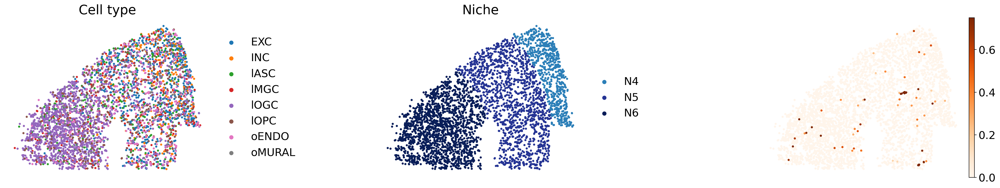

In [24]:
sc.pl.spatial(adata_mtg[adata_mtg.obs['batch']=='H18.06.006.MTG.4000.rep2'],color=['cluster_L1','niche','MYH11'],vmax='p99.5',cmap='Oranges',spot_size=50,title=['Cell type','Niche',' '],frameon=False,wspace=0.5)

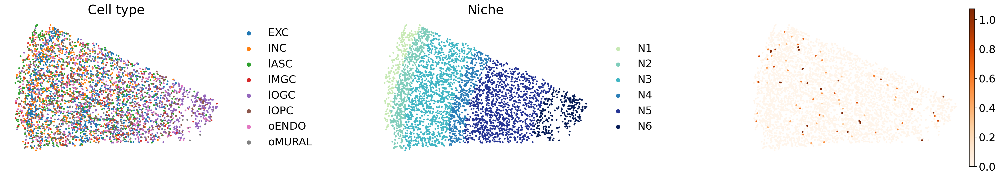

In [25]:
sc.pl.spatial(adata_mtg[adata_mtg.obs['batch']=='H18.06.006.MTG.4000.rep3'],color=['cluster_L1','niche','MYH11'],vmax='p99.5',cmap='Oranges',spot_size=50,title=['Cell type','Niche',' '],frameon=False,wspace=0.5)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


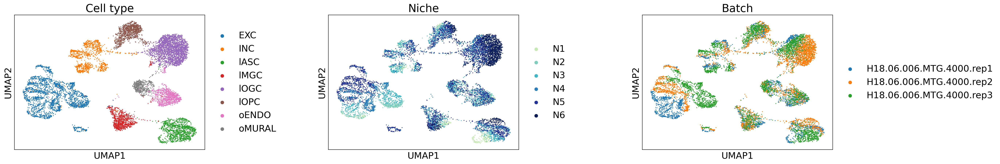

In [33]:
sc.pp.pca(adata_mtg)
sc.pp.neighbors(adata_mtg,use_rep='X_pca')
sc.tl.umap(adata_mtg)
sc.pl.umap(adata_mtg,color=['cluster_L1','niche','batch'],title=['Cell type','Niche','Batch'],wspace=0.5)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


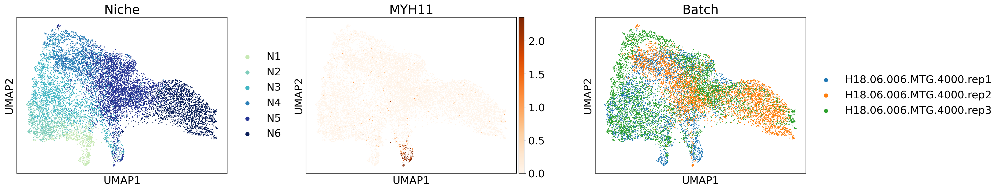

In [45]:
sc.pp.neighbors(adata_mtg,use_rep='simvikl_s0')
sc.tl.umap(adata_mtg)
sc.pl.umap(adata_mtg,color=['niche','MYH11','batch'],title=['Niche','MYH11','Batch'],cmap='Oranges',vmax='p99.5',wspace=0.25)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


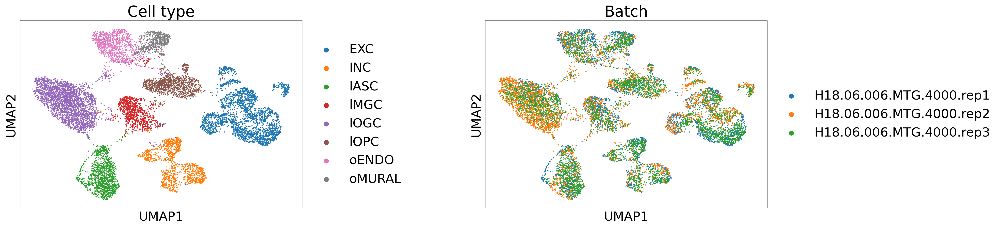

In [44]:
sc.pp.neighbors(adata_mtg,use_rep='simvikl_z0')
sc.tl.umap(adata_mtg)
sc.pl.umap(adata_mtg,color=['cluster_L1','batch'],title=['Cell type','Batch'],cmap='Oranges',vmax='p99.5',wspace=0.5)

### visualizations for other methods can be simply obtained by replacing 'simvikl_z0' to other methods

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


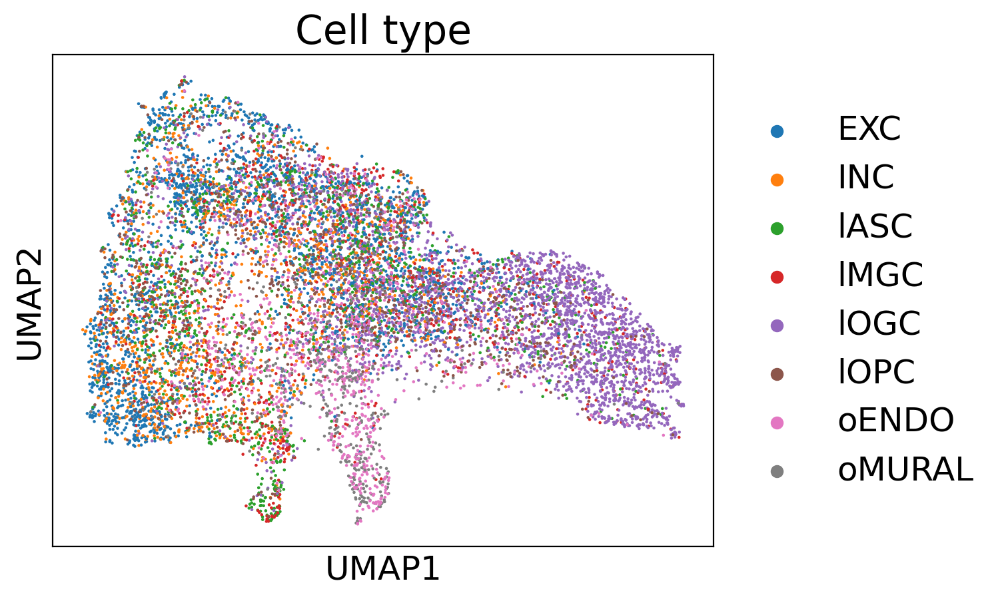

In [48]:
sc.pp.neighbors(adata_mtg,use_rep='simvikl_s0')
sc.tl.umap(adata_mtg)
sc.pl.umap(adata_mtg,color=['cluster_L1'],title=['Cell type'],cmap='Oranges',vmax='p99.5',wspace=0.5)